<a href="https://colab.research.google.com/github/MariiaS/ds_kaggle/blob/main/ip102_polytech2020dec_entomologists.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Polytech' Nice Data Science course 2020
## Insect Recognition
### Yazan, Mariia, Ivan, Gabriele

In the following notebook We'll show the work done by loading, cleaning, exploring and training a neural network with the purpose of classifing a dataset of insects. The dataset at issue is composed of a large number of images of different sizes belonging to **102** different species of insects from this dataset: https://www.kaggle.com/c/polytech-ds-2020 https://www.kaggle.com/iezabrodin/training-images-imgfolder

## Loadind the data

In [ ]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os

import pandas as pd

from PIL import Image, ImageEnhance, ImageOps

from fastai.imports import *
from fastai.text.all import *
from fastai.vision import *
from fastai.vision.all import *
from fastai.basics import *
import random
from random import randrange

from keras.preprocessing.image import ImageDataGenerator
from tensorflow import keras
from keras import applications

import torch
from torchvision import datasets, transforms
from torchvision.datasets import ImageFolder
from torchvision.transforms import ToTensor
from torch.utils import data
from torchvision.utils import make_grid


In [ ]:
%reload_ext autoreload
%autoreload 2
%matplotlib inline

In [ ]:
path = "../input/polytech-ds-2020/ip102_polytech_v2/ip102_polytech/";
os.listdir(path)
pathToTrainDataLabels = path+"train.txt"
pathToValidationDataLabels = path+"val.txt"
pathToClasses = "/kaggle/input/polytech-ds-2020/classes.txt"
pathToTrainImgFolderImages = "../input/training-images-imgfolder/training_images_imgfolder"
pathToTrainImages = path+ "training_images/"
pathToTestImages = path+"test_images/"
pathToSample = path+"sample_submission.csv"

## Exploring the data

# The Dataset
**There are 52603 images in total that can be used for training and validation.**
**The dataset has 102 classes, next we will check the distribution of samples among the classes**

In [ ]:
pd.read_csv(pathToClasses, nrows=5)

,1 rice leaf roller \t\t\t
0,2 rice leaf caterpillar \t\t
1,3 paddy stem maggot \t\t\t
2,4 asiatic rice borer \t\t\t
3,5 yellow rice borer \t\t\t
4,6 rice gall midge \t\t\t


In [ ]:
trainDf = pd.read_csv(pathToTrainDataLabels,names=['name','class'], sep=" ", header=None)
trainDf.head()

,name,class
0,00002.jpg,0
1,00003.jpg,0
2,00005.jpg,0
3,00006.jpg,0
4,00008.jpg,0


In [ ]:
valDf = pd.read_csv(pathToValidationDataLabels,names=['name','class'], sep=" ", header=None)
valDf.head()

,name,class
0,00009.jpg,0
1,00012.jpg,0
2,00014.jpg,0
3,00034.jpg,0
4,00035.jpg,0


**Connect train and validation folders together**

In [ ]:
dataFrame = trainDf.append(valDf)

In [ ]:
dataFrame.head()

,name,class
0,00002.jpg,0
1,00003.jpg,0
2,00005.jpg,0
3,00006.jpg,0
4,00008.jpg,0


(array([ 780.,  340.,  182.,  737.,  352.,  354.,  258.,  583.,  625.,
         387.,  599.,  282.,  121.,  286.,  602., 1154.,  620.,  102.,
         597.,  343.,  335.,  370., 1188.,  749., 2865.,  395.,  483.,
         457.,  227.,  495.,  339.,  163.,  171.,  204.,  237.,   95.,
          72.,  552.,  598., 1122.,  209.,  189.,  215.,  133.,  366.,
         746.,  459.,  574.,  975.,  457.,  986., 1327.,  182.,  123.,
         615.,  129.,  328.,  266.,  979.,  247.,  123.,   55.,  198.,
          58.,  214.,   98.,  534., 3716.,  805.,  895., 3556.,  484.,
          49.,  314.,  269.,  120.,  505.,  293.,  180.,  157.,   51.,
          69.,  482.,  271.,  307.,  117.,  912.,  217.,  282.,  132.,
         158.,  245.,  564.,  353.,  404.,  340.,  147.,  213.,   65.,
         388., 4337.]),
 array([  0.,   1.,   2.,   3.,   4.,   5.,   6.,   7.,   8.,   9.,  10.,
         11.,  12.,  13.,  14.,  15.,  16.,  17.,  18.,  19.,  20.,  21.,
         22.,  23.,  24.,  25.,  26.,  27.,  28

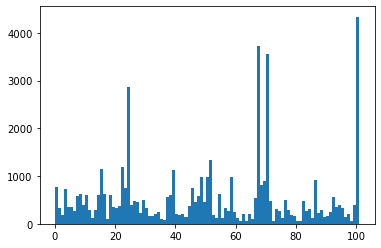

In [ ]:
num_of_classes=dataFrame.groupby('class').count().max().values
plt.hist(dataFrame['class'],bins=101)

**As we can see, some classes have segnificantly more samples than other class, for exmple class 101 has more than 4000 samples while some classes have less than 50 samples, this can lead to overfitting on those classes and underfitting on the classes with fewest samples**

**We would like to randomly delete some samples from specific classes to have a slightly better distribution(we will still have inequality, some classes with large number of samples and some classes with small number of samples)**

In [ ]:
while(num_of_classes>=2000):
    num_of_classes=dataFrame.groupby('class').count().max().values
    indicies_to_delete=dataFrame.groupby('class').count()[dataFrame.groupby('class').count().values>=2000].index
    for i in indicies_to_delete:
        drop_indices = np.random.choice(dataFrame[dataFrame['class']==i].index, 1300, replace=False)
        print(drop_indices)
        dataFrame = dataFrame.drop(drop_indices)

[11518 10929 11354 ... 11494 10495 11951]
[29279 27368 27905 ... 27074 28577 27501]
[ 5385  5258 31772 ... 31971 32134 33924]
[43247 43066 43621 ... 44834 44566 43982]
[29495 29042 27620 ... 29234  4701  4583]
[ 5553 34227 33864 ...  5652 33154  5341]
[44005 42062 42689 ... 41884 42136 42082]


(array([ 780.,  340.,  182.,  720.,  209.,  323.,  258.,  583.,  625.,
         387.,  599.,  113.,   47.,  157.,  367., 1026.,  527.,   49.,
         374.,  343.,  335.,  370., 1188.,  749., 1565.,  395.,  483.,
         457.,  227.,  495.,  339.,  163.,  171.,  204.,  237.,   95.,
          72.,  552.,  598., 1122.,  209.,  189.,  215.,  133.,  366.,
         746.,  459.,  574.,  975.,  457.,  986., 1327.,  182.,  123.,
         615.,  129.,  328.,  266.,  979.,  247.,  123.,   55.,  198.,
          58.,  214.,   98.,  534., 1116.,  805.,  895.,  956.,  484.,
          49.,  314.,  269.,  120.,  505.,  293.,  180.,  157.,   51.,
          69.,  482.,  271.,  307.,  117.,  912.,  217.,  282.,  132.,
         158.,  245.,  564.,  353.,  404.,  340.,  147.,  213.,   65.,
         388., 1737.]),
 array([  0.,   1.,   2.,   3.,   4.,   5.,   6.,   7.,   8.,   9.,  10.,
         11.,  12.,  13.,  14.,  15.,  16.,  17.,  18.,  19.,  20.,  21.,
         22.,  23.,  24.,  25.,  26.,  27.,  28

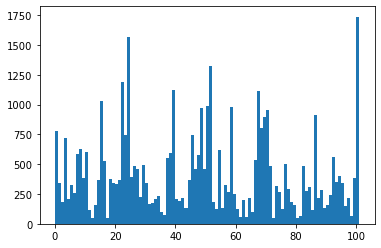

In [ ]:
plt.hist(dataFrame['class'],bins=101)

**As we can see now more classes have similar number of samples, and the differences are smaller than before, but still can be seen of course**

# Experimentation With Different Models

**At the beggining we tried various models to choose the one that gives the highest accuracy, as everyone in the team has different experiences with different libraries we worked with Keras, PyTortch and FastAi**

#  Keras

**As the dataset is quite large we had to use dataloaders to load the data in bathces and not at once into the memory**
**In Keras we used ImageDataGenerator, which brings the data in batches into the memory and does the given transformations on the data, we are using keras.applications.resnet.preprocess_input as to preprocess the images as we are going to use a pretrained resnet, adn the resnets in Keras are trained on ImageNet on a specefic processing was done and we would like to use that same preprocessing.
Then we resize the images, since the images provided don't have the same sizes**

**Creating ImageDataLoader.** Also, do reseizing and data augmentation. Our validation set is 20% of the final, randomly selected

dls = ImageDataLoaders.from_df(df = dataFrame, path = pathToTrainImages, item_tfms=Resize(224), valid_pct=0.2, seed=42, sz=64, bs=16, batch_tfms=aug_transforms(mult=2))

In [ ]:
trainDf['class']=trainDf['class'].astype('str')
valDf['class']=valDf['class'].astype('str')
datagen = ImageDataGenerator(preprocessing_function=keras.applications.resnet.preprocess_input)
train_generator=datagen.flow_from_dataframe(dataframe=trainDf,
                                            directory=pathToTrainImages,
                                            x_col="name",
                                            y_col="class",
                                            class_mode="categorical",
                                            target_size=(227,227),
                                            batch_size=64,
                                            shuffle=True,
                                            seed=42)
valid_generator=datagen.flow_from_dataframe(dataframe=valDf,
                                            directory=pathToTrainImages,
                                            x_col="name",
                                            y_col="class",
                                            class_mode="categorical",
                                            target_size=(227,227),
                                            batch_size=64,
                                            shuffle=True,
                                            seed=42)

Found 45095 validated image filenames belonging to 102 classes.
Found 7508 validated image filenames belonging to 102 classes.


**The following code can show some images from the batches loaded using the ImageDataGenerator and the transformation can be seen**

77
17
51
9


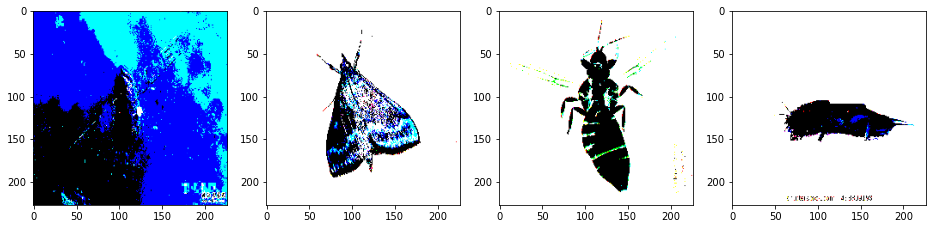

In [ ]:
image_t, label_t = train_generator.next()
image_v, label_v = valid_generator.next()
fig=plt.figure(figsize=(16, 16))
for i in range(1,5):
    fig.add_subplot(1, 4, i)
    plt.imshow(image_t[i])
    print(np.argmax(label_t[i]))

**We used the pretrained ResNet50 from Keras as part of the experementation**

In [ ]:
# base_model = applications.resnet50.ResNet50(weights= 'imagenet', include_top=False, input_shape= (227,227,3))
# for layer in base_model.layers:
#     layer.trainable = False
# for i in range(10):
#     base_model.layers[-i].trainable=True
# x = base_model.output
# x = AveragePooling2D(pool_size=(8,8))(x)
# x = Flatten()(x)
# x = Dense(1024,activation='selu')(x)
# x = Dropout(0.2)(x)
# x = Dense(512,activation='selu')(x)
# x = Dropout(0.2)(x)
# x = Dense(256,activation='selu')(x)
# x = Dropout(0.2)(x)
# x = Dense(128,activation='selu')(x)
# x = Dropout(0.2)(x)
# x = Dense(102, activation= 'softmax')(x)

# model_pretrained = keras.Model(inputs = base_model.input, outputs = x)
# INIT_LEARNING_RATE=0.0009
# NUMBER_OF_EPOCHS=4
# opt = keras.optimizers.Nadam(lr=INIT_LEARNING_RATE)
# model_pretrained.compile(optimizer=opt,
# loss="categorical_crossentropy", metrics=["accuracy"])
# STEP_SIZE_TRAIN=train_generator.n//train_generator.batch_size
# STEP_SIZE_VALID=valid_generator.n//valid_generator.batch_size
# es = EarlyStopping(monitor='val_loss', mode='min', verbose=1)
# model_pretrained.fit_generator(generator=train_generator,
#                     steps_per_epoch=STEP_SIZE_TRAIN,
#                     validation_data=valid_generator,
#                     validation_steps=STEP_SIZE_VALID,
#                     epochs=NUMBER_OF_EPOCHS,
#                               callbacks=[es])

# A refelction on the model and the hyper parameters when using Keras

**We tried different combinations of parameters, we were tweaking the optimzer, the learning rate, the size batches and the number of epochs, we also used dropout to avoid overfitting**
**We tried different optimizers with different parameters, we tried SGD, Adam, RMSProp and Nadam, we got the best results from Nadam, as the learning had to be small it was performing better with models with momentum**
**We tried the following values for the learning rate: 0.01, 0.001, 0.0001, 0.0009, the best results were given with the smallest learning rates 0.0001 and 0.0009**
**The model started overfitting, and the increase in learning dropped after 4 epochs so we decided to use 4**

# PyTorch

In parralel with Keras experementaiton, we decided to build another convolutional neural network from scratch using pytorch to undestand process deeper and give not pretrained model a try. Also, following the idea of learning another methods to work with data and with kaggle API the initial dataset was rebuild in the ImageFolder format and added to the notebook.

In [ ]:
transform = transforms.Compose([transforms.Resize(256),
                                transforms.CenterCrop(256),
                                transforms.ToTensor()])

ds = ImageFolder(pathToTrainImgFolderImages, transform = transform)

Here we are using fixed validation set size and custom seed for the random generator to always be able to work with the same data sets.

In [ ]:
torch.manual_seed(13);
val_size = 5000
train_size = len(ds) - val_size

train_ds, val_ds = torch.utils.data.random_split(ds, [train_size, val_size])

batch_size = 64

train_dl = DataLoader (train_ds,
                      batch_size,
                      shuffle=True,
                      num_workers = 4, pin_memory = True)


val_dl = DataLoader   (val_ds,
                      batch_size*2,
                      shuffle=True, pin_memory = True)

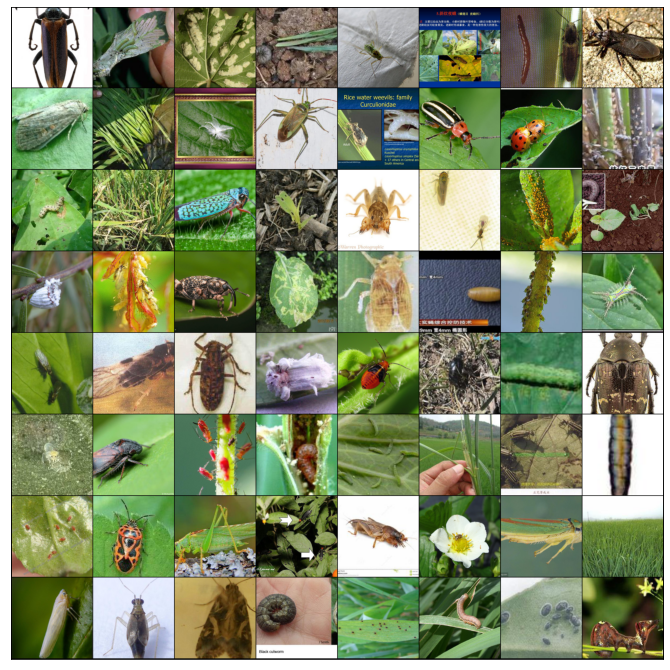

In [ ]:
def show_batch(dl):
    for images, labels in dl:
        fig, ax = plt.subplots(figsize = (12,12))
        ax.set_xticks([]); ax.set_yticks([])
        ax.imshow(make_grid(images, nrow=8).permute(1,2,0))
        break
show_batch(train_dl)

Now let's move on to implementing our networks and classes-helpers. First of all in *BaseClassificationMethods* we will define all methods that will help us to perform training and validation.

In [ ]:
class BaseClassificationMethods(nn.Module):
    def training_step(self, batch):
        images, labels = batch 
        out = self(images)                  # Generate predictions
        loss = F.cross_entropy(out, labels) # Calculate loss
        return loss
    
    def validation_step(self, batch):
        images, labels = batch 
        out = self(images)                    # Generate predictions
        loss = F.cross_entropy(out, labels)   # Calculate loss
        acc = accuracy(out, labels)           # Calculate accuracy
        return {'val_loss': loss.detach(), 'val_acc': acc}
        
    def validation_epoch_end(self, outputs):
        batch_losses = [x['val_loss'] for x in outputs]
        epoch_loss = torch.stack(batch_losses).mean()   # Combine losses
        batch_accs = [x['val_acc'] for x in outputs]
        epoch_acc = torch.stack(batch_accs).mean()      # Combine accuracies
        return {'val_loss': epoch_loss.item(), 'val_acc': epoch_acc.item()}
    
    def epoch_end(self, epoch, result):
        print("Epoch [{}], train_loss: {:.4f}, val_loss: {:.4f}, val_acc: {:.4f}".format(
            epoch, result['train_loss'], result['val_loss'], result['val_acc']))
        
def accuracy(outputs, labels):
    _, preds = torch.max(outputs, dim=1)
    return torch.tensor(torch.sum(preds == labels).item() / len(preds))

And down bellow we will put two methods to work with device and load data into it ('cuda' in our case)

In [ ]:
def to_device(data, device):
    #Move tensors to device
    if isinstance(data, (list,tuple)):
        return [to_device(x, device) for x in data]
    return data.to(device, non_blocking=True)

class DeviceDataLoader():
    #Wrap a dataloader to move data to a device
    def __init__(self, dl, device):
        self.dl = dl
        self.device = device
        
    def __iter__(self):
        #Take a batch of data after moving it to device
        for b in self.dl: 
            yield to_device(b, self.device)

    def __len__(self):
        #Number of batches
        return len(self.dl)

Finally, we can now implement the model that we are going to use.
The Conv2d layer transforms a 3-channel image to a 12-channel feature map, and the MaxPool2d layer halves the height and width. The feature map gets smaller as we add more layers, until we are finally left with a small feature map, which can be flattened into a vector. We can then add some fully connected layers at the end to get vector of size 102 for each image.

In [ ]:
kernel_size = 3

class CnnModelPytorch(BaseClassificationMethods):
    def __init__(self):
        super().__init__()
        self.network = nn.Sequential(
            nn.Conv2d(3, 12, kernel_size=kernel_size, padding=1),
            nn.ReLU(),
            nn.Conv2d(12, 24, kernel_size=kernel_size, stride=1, padding=1),
            nn.ReLU(),
            nn.MaxPool2d(2, 2), # output: 16 x 128 x 128

            nn.Conv2d(24, 48, kernel_size=kernel_size, stride=1, padding=1),
            nn.ReLU(),
            nn.Conv2d(48, 48, kernel_size=kernel_size, stride=1, padding=1),
            nn.ReLU(),
            nn.MaxPool2d(2, 2), # output: 32 x 64 x 64

            nn.Conv2d(48, 96, kernel_size=kernel_size, stride=1, padding=1),
            nn.ReLU(),
            nn.Conv2d(96, 96, kernel_size=kernel_size, stride=1, padding=1),
            nn.ReLU(),
            nn.MaxPool2d(2, 2), # output: 64 x 32 x 32

            nn.Flatten(), 
            nn.Linear(96*32*32, 1024),
            nn.ReLU(),
            nn.Linear(1024, 512),
            nn.ReLU(),
            nn.Linear(512, 102))
        
    def forward(self, xb):
        return self.network(xb)

We are using nn.Sequential to chain the layers and activations functions into a single network architecture. Let's verify that the model produces the expected output on a batch of training data. The 102 outputs for each image can be interpreted as probabilities for the 102 target classes (after applying softmax), and the class with the highest probability is chosen as the label predicted by the model for the input image.

In [ ]:
model = CnnModelPytorch()
model

CnnModelPytorch(
  (network): Sequential(
    (0): Conv2d(3, 12, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU()
    (2): Conv2d(12, 24, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU()
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (5): Conv2d(24, 48, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (6): ReLU()
    (7): Conv2d(48, 48, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): ReLU()
    (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (10): Conv2d(48, 96, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU()
    (12): Conv2d(96, 96, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (13): ReLU()
    (14): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (15): Flatten(start_dim=1, end_dim=-1)
    (16): Linear(in_features=98304, out_features=1024, bias=True)
    (17): ReLU()
    (18): Linear(in_features=1

We can now wrap our training and validation data loaders using DeviceDataLoader for automatically transferring batches of data to the GPU, and use to_device to move our model to the GPU.

In [ ]:
train_dl = DeviceDataLoader(train_dl, 'cuda')
val_dl = DeviceDataLoader(val_dl, 'cuda')
model = to_device(model, 'cuda')

We'll define two functions: fit and evaluate to train the model using gradient descent and evaluate its performance on the validation set.

In [ ]:
def evaluate(model, val_loader):
    model.eval()
    outputs = [model.validation_step(batch) for batch in val_loader]
    return model.validation_epoch_end(outputs)

def fit(epochs, lr, model, train_loader, val_loader, opt_func=torch.optim.SGD):
    history = []
    optimizer = opt_func(model.parameters(), lr)
    for epoch in range(epochs):
        # Training Phase 
        model.train()
        train_losses = []
        for batch in train_loader:
            loss = model.training_step(batch)
            train_losses.append(loss)
            loss.backward()
            optimizer.step()
            optimizer.zero_grad()
        # Validation phase
        result = evaluate(model, val_loader)
        result['train_loss'] = torch.stack(train_losses).mean().item()
        model.epoch_end(epoch, result)
        history.append(result)
    return history

We'll use the following hyperparmeters (learning rate, no. of epochs, batch_size etc.) to train our model. 

In [ ]:
num_epochs = 8
opt_func = torch.optim.Adam
lr = 0.001
history = fit(num_epochs, lr, model, train_dl, val_dl, opt_func)

Epoch [0], train_loss: 4.1507, val_loss: 4.0927, val_acc: 0.1016
Epoch [1], train_loss: 3.9482, val_loss: 3.7383, val_acc: 0.1566
Epoch [2], train_loss: 3.6403, val_loss: 3.5532, val_acc: 0.1949
Epoch [3], train_loss: 3.2893, val_loss: 3.4436, val_acc: 0.2098
Epoch [4], train_loss: 2.6681, val_loss: 3.6295, val_acc: 0.2258
Epoch [5], train_loss: 1.7947, val_loss: 4.1782, val_acc: 0.2428
Epoch [6], train_loss: 1.0058, val_loss: 5.4203, val_acc: 0.2342
Epoch [7], train_loss: 0.5268, val_loss: 6.7759, val_acc: 0.2330


And for the better result analysis we can draw plots of accuracies and losses.

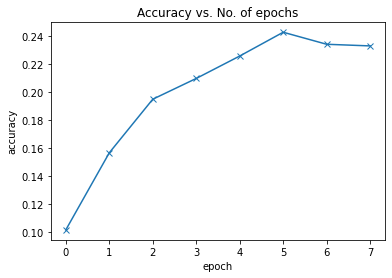

In [ ]:
def plot_accuracies(history):
    accuracies = [x['val_acc'] for x in history]
    plt.plot(accuracies, '-x')
    plt.xlabel('epoch')
    plt.ylabel('accuracy')
    plt.title('Accuracy vs. No. of epochs');
    
plot_accuracies(history)

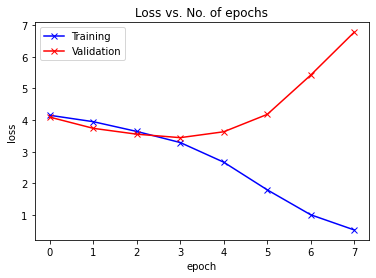

In [ ]:
def plot_losses(history):
    train_losses = [x.get('train_loss') for x in history]
    val_losses = [x['val_loss'] for x in history]
    plt.plot(train_losses, '-bx')
    plt.plot(val_losses, '-rx')
    plt.xlabel('epoch')
    plt.ylabel('loss')
    plt.legend(['Training', 'Validation'])
    plt.title('Loss vs. No. of epochs');

plot_losses(history)

According to the results above we can conclude that this approach can be useful, but we certainly need depper network and probably pre pre-trained before. Such small models are usually good to recognize really different objects, but in our case we have a lot of images in the dataset that are very similar to each other. With changes to model parameters such as number of features and kernel size we could get almost the same results but with this configuration we have the best picture of continuous learning during first several epochs and decreasing of accuracy by the end, so we decided to leave it as a final illustration of job that have been done. Fortunelly, it is possible now to find and use pre-trained versions of convolutional neural networks, so we decided to stop experiments with this one and at the next part we are going to present the actual solution that we found best to solve this task.

## Generating the sets - The Augmentation Trials
Since the dataset is huge, but really uneven distributes among classes, and the online memory allocated for this evry notebook is not sufficient, we went for a `ImageDataLoaders` which is going to solve our memory issues. On top of that, this specific `ImageDataLoaders.from_df` has specific parameters used to execute **Augmentation** directly on the just generated images, and this can be done in batches (`batch_tfms`) or on the single items (`item_tmfs`). We'll see in the future how this will affect the results.

First we'll try display the most basic augmentation to get an idea of what kind of transformation we're applying to our images.

Some of the augmentation perfomred will be shown (hopefully) as it follows.

In [ ]:
tfms = aug_transforms(max_rotate=25)

In [ ]:
len(tfms)

2

### Meet the *Rice Leaf Caterpillar*
In what follows we'll use the library Pillow to show some of the transformations we'd like to perform on the generated set of train images. From the literature we dicovered that rotation is really meaningfull transformation since it changes the angles. Specifically with insects this could be meaning full since in our dataset there are also many figures taken from biology manuals and enciclopediae, all of this share the same vertical angle most of the time while when taking a picture of an insect in real life it's never from the same poing of view.



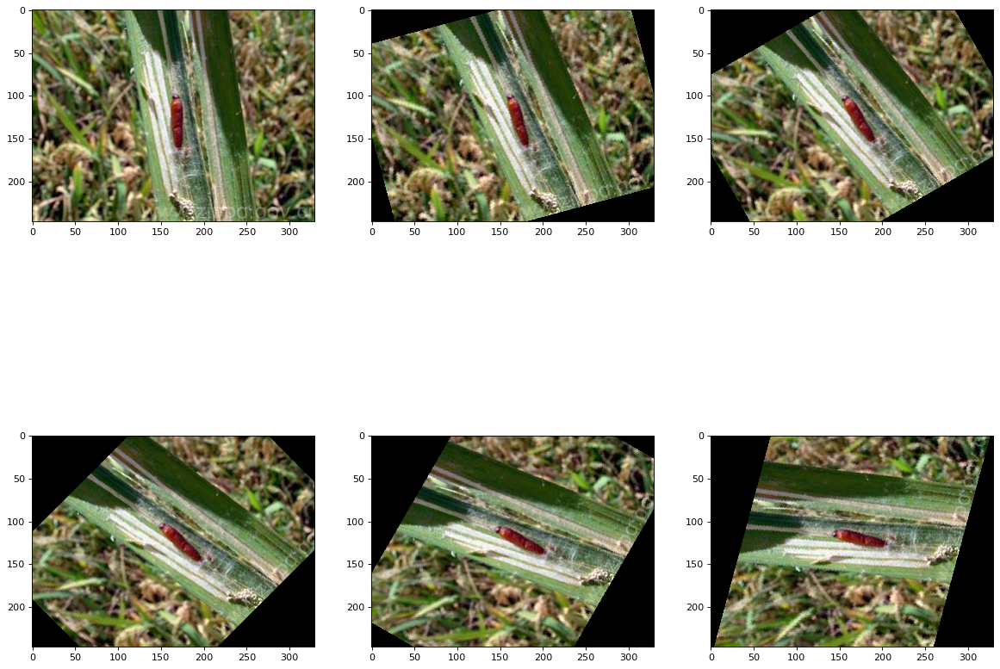

In [ ]:
im = Image.open('../input/polytech-ds-2020/ip102_polytech_v2/ip102_polytech/training_images/00003.jpg')
im_t = cast(array(im), TensorImage)


fig = plt.figure(num=None, figsize=(18, 15), dpi=80, facecolor='w', edgecolor='k')
a = 1
for r in range(0,90,15):
    
    ax1 = fig.add_subplot(2,3,a)
    ax1.imshow(im.rotate(r))
    a=a+1

Since we are talking about animals that live in the wild most of the time and are not waiting for us to take a picture of them, **random cropping** is a really powerful tool since often the insects are partially visible or shaded by objects such as leaves, other insects of dirt. In our case cropping really helps us generate an augmented set of images that resemble the real life hide-and-seek behaviour of insects, henche helping our model to be more generalized.

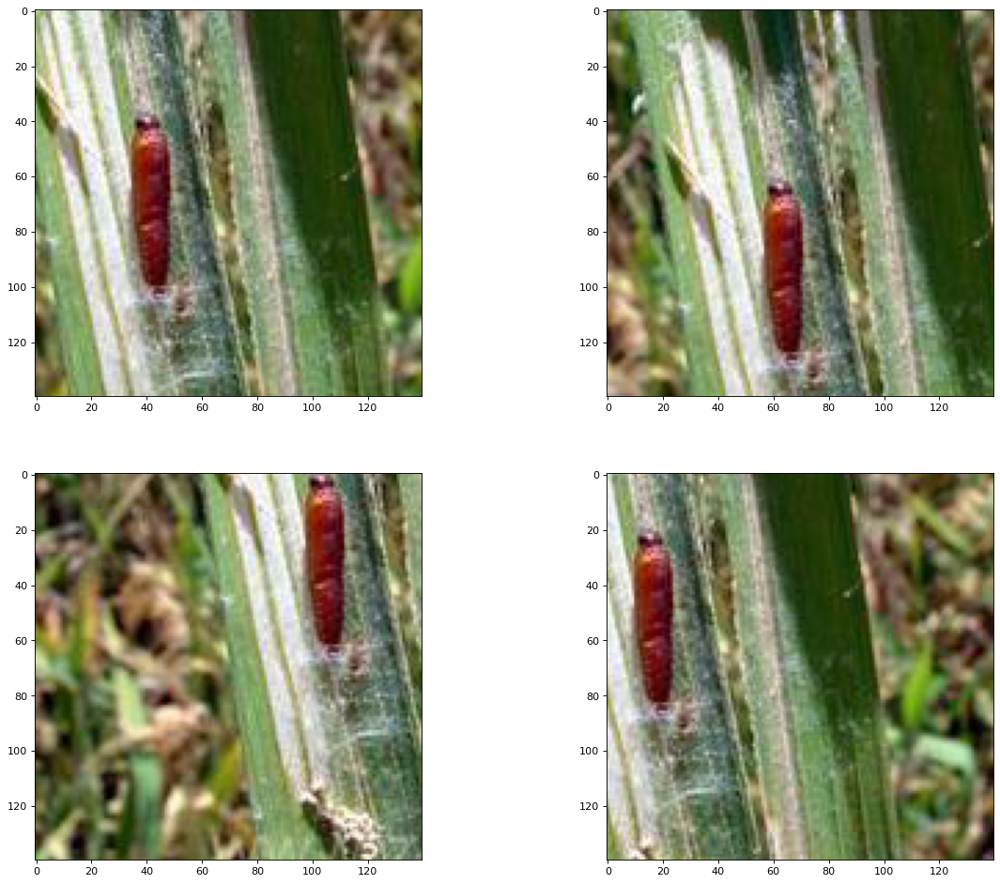

In [ ]:
x, y = im.size

matrix = 140 # size of cropping area
sample = 5 # number of cropped images
sample_list = []

fig = plt.figure(num=None, figsize=(18, 15), dpi=80, facecolor='w', edgecolor='k')

for i in range(sample-1):
    x1 = randrange(0, x - matrix)
    y1 = randrange(0, y - matrix)
    sample_list.append(im.crop((x1, y1, x1 + matrix, y1 + matrix)))
    
    ax0 = fig.add_subplot(2,2,i+1)
    ax0.imshow(sample_list[i])

We also discussed the idea of **central cropping** but we noticed that most of the times we would have just lost sight of our insect and generate a nice, grassy image.

In the next box we'll perform a **central cropping** and show that after a few "zoom in" we miss the target, in this case it could be worth since the ratio insect/image is pretty low, but it's not the most common situation in this dataset and some times insects take the whole size of the image, making this transformation useless.

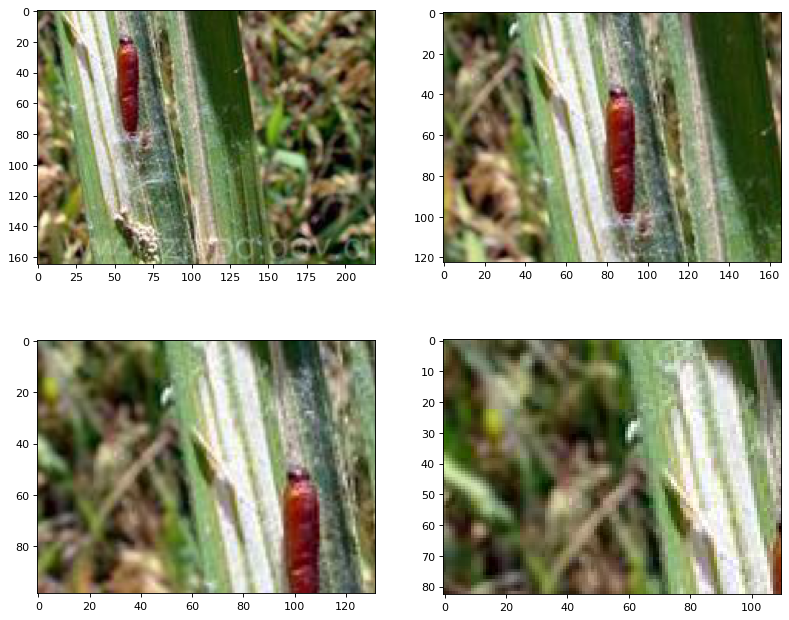

In [ ]:
fig = plt.figure(num=None, figsize=(12, 10), dpi=80, facecolor='w', edgecolor='k')

for c in range (3,7,1):
    width, height = im.size   # Get dimensions
    left = width/c
    top = height/c
    right = 3 * width/c
    bottom = 3 * height/c

    ax1 = fig.add_subplot(2,2,c-2)
    ax1.imshow(im.crop((left, top, right, bottom)))

We immediately noticed that many of the images are taken in nature (even though we can also find sketches, memes and other representation of insects inside this dataset). As said many of them are taken in the fields with natural light and share a common grassy/green background. We then took into consideration that, maybe, was a good idea to augmente the images with respect to contrast and brightness, anyhow for what concerns the color part rather than focusing too much on shape or orientation.

Augmenting brightness for natural light images in important so that the model takes into account that many differnt and unexpected light situations could appear, and this is something to expect when images of insects are taken on the fly while our bug is chilling on a wild graminaceae leaf. 

For that we did what following to transform the images. 

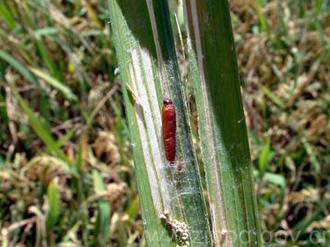

In [ ]:
#image brightness enhancer
enhancer = ImageEnhance.Brightness(im)

factor = 1 #gives original image for comparison
im_output = enhancer.enhance(factor)
im_output

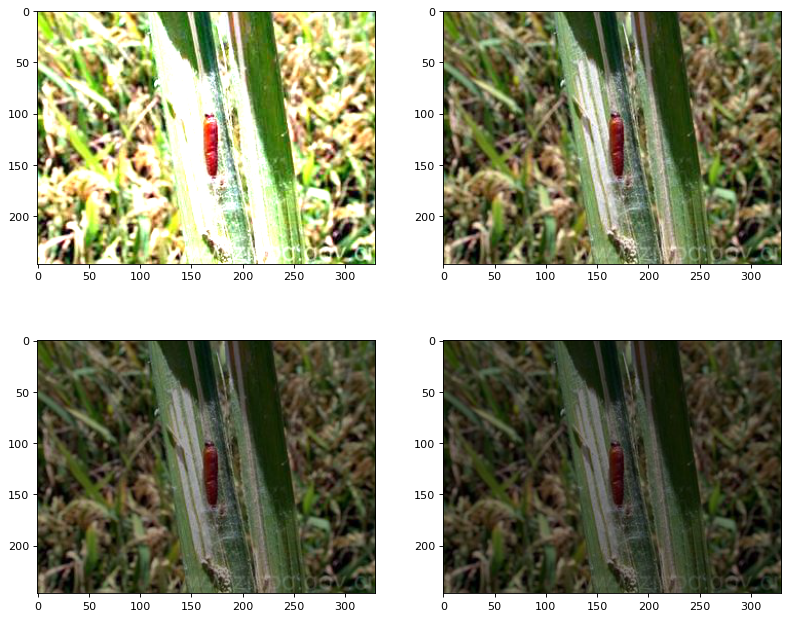

In [ ]:
fig = plt.figure(num=None, figsize=(12, 10), dpi=80, facecolor='w', edgecolor='k')

for factor in range(1,5,1):
    
    im_output = enhancer.enhance(2/factor)
    ax1 = fig.add_subplot(2,2,factor)
    ax1.imshow(im_output)

On top of that we decided to dig the color side of the images and augment contrast and hue. Doing so is helpful because when increasing contrast in low resolution images, it could be that details (even if in low resolution) could pop out and since categorizing insects is a matter of dots, color, antennas and other small details we thought it was meaningful to enhance this aspect of our images. 

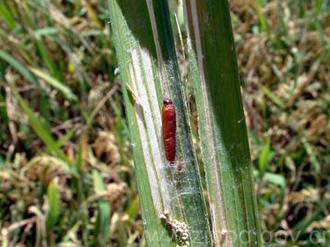

In [ ]:
#read the image
im_contr = Image.open("../input/polytech-ds-2020/ip102_polytech_v2/ip102_polytech/training_images/00003.jpg")

#image brightness enhancer
enhancer = ImageEnhance.Contrast(im)

factor = 1 #gives original image for comparison
im_output = enhancer.enhance(factor)
im_output

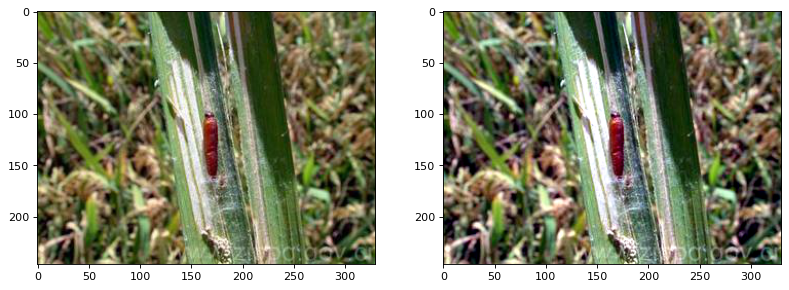

In [ ]:
# applying autocontrast method  
im2 = ImageOps.autocontrast(im, cutoff = 2, ignore = 2) 

fig = plt.figure(num=None, figsize=(12, 10), dpi=80, facecolor='w', edgecolor='k')
ax1 = fig.add_subplot(1,2,1)
ax1.imshow(im)
ax2 = fig.add_subplot(1,2,2)
ax2.imshow(im2)

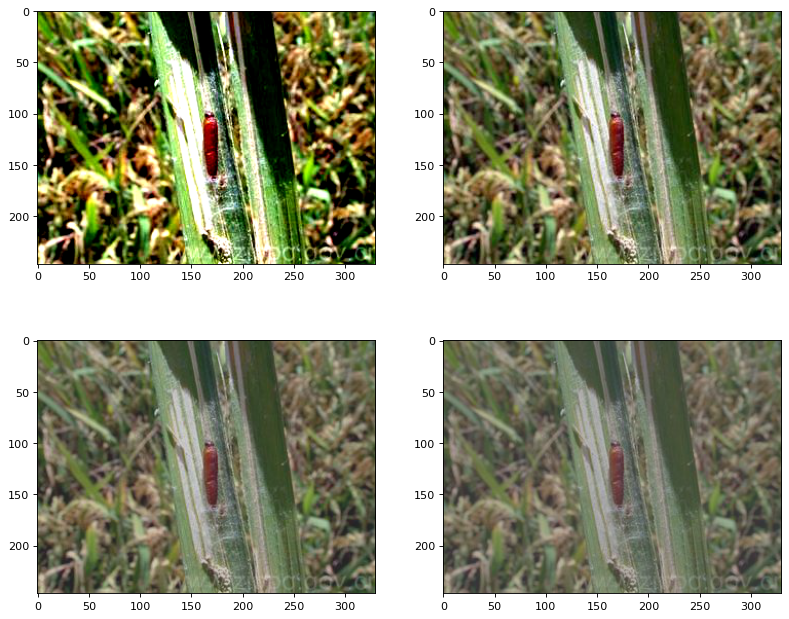

In [ ]:
fig = plt.figure(num=None, figsize=(12, 10), dpi=80, facecolor='w', edgecolor='k')

for factor in range(1,5,1):
    
    im_output = enhancer.enhance(2/factor)
    ax1 = fig.add_subplot(2,2,factor)
    ax1.imshow(im_output)

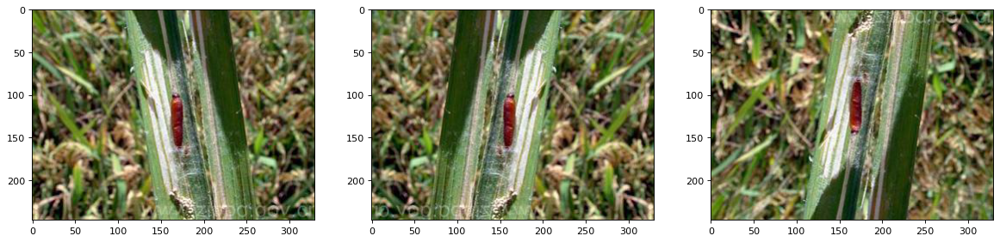

In [ ]:
fig = plt.figure(num=None, figsize=(18, 15), dpi=80, facecolor='w', edgecolor='k')

ax0 = fig.add_subplot(1,3,1)
ax0.imshow(im)

ax1 = fig.add_subplot(1,3,2)
ax1.imshow(im.transpose(Image.FLIP_LEFT_RIGHT))

ax2 = fig.add_subplot(1,3,3)
ax2.imshow(im.transpose(Image.FLIP_TOP_BOTTOM))

As stated in paragraph above, the classes are unevenly distributed with a range of occurrencies really wide. We, then, decided to scale them in order to avoid having classes with 40 occurrencies and claases with 4000 both contributing in the same learning process. 

Since cutting down a lot of images will make us loose a lot of learning materials we also decided to increase the number of images by performing augmentation on the images so that we could end up, eventually, with a comparable number of learning images.


In [ ]:
dls = ImageDataLoaders.from_df(df = dataFrame, path = pathToTrainImages, item_tfms=Resize(224), valid_pct=0.2, seed=2, sz=64, bs=32, bathc_tfms=aug_transforms(
mult = 2,
  do_flip = 1,
  flip_vert = 1,
  max_rotate = 90,
  min_zoom = 0.5,
  max_zoom = 4,
  max_lighting = 4,
  max_warp = 0.1,
  p_affine = 0.75,
  p_lighting = 1.5,
  xtra_tfms = True,
  size = None,
  mode = "bilinear",
  pad_mode = "reflection",
  align_corners = 0,
  batch = 1,
  min_scale = 1))

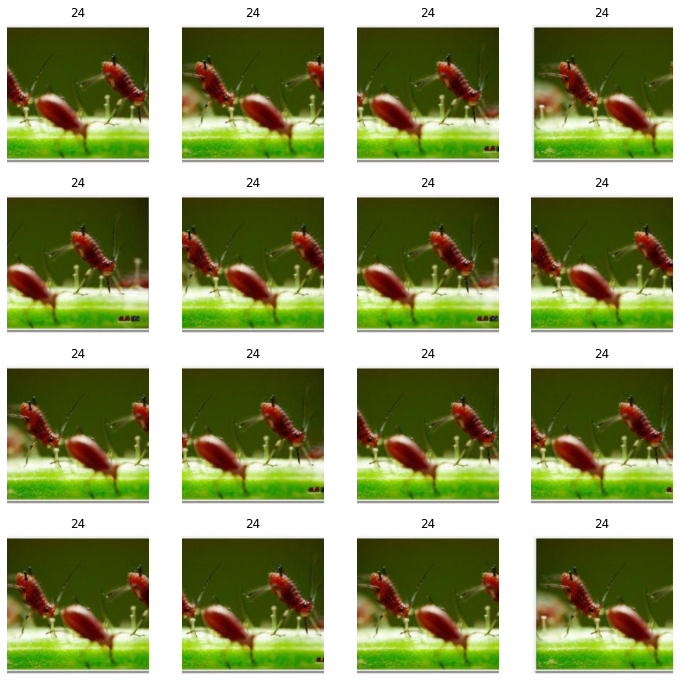

In [ ]:
dls.train.show_batch(max_n=16, nrows=4, unique=True)

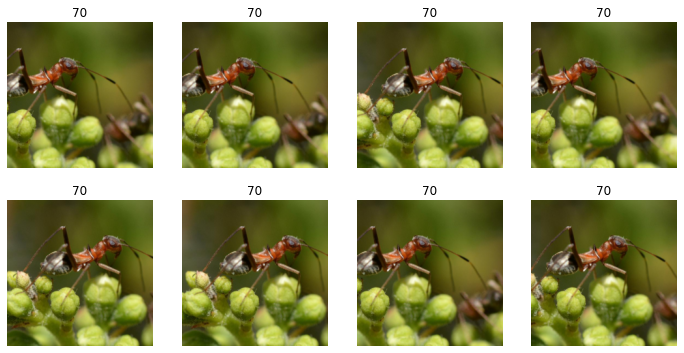

In [ ]:
dls_1 = ImageDataLoaders.from_df(df = dataFrame, path = pathToTrainImages, item_tfms=Resize(224), bathc_tfms=aug_transforms(mult=2))
dls_1.train.show_batch(max_n=8, nrows=2, unique=True)

# Training the model

**ResNet** is a convolutional neural network that is 34, 50 or 101 layers deep accordingly, it was trained on more than a million images from the ImageNet database. We selected this model, as it was pretrained on the large amount of images, is from 34 to 101 layers deep and fits well for the task of the image classification on the large dataset as we are having.

To compare the models, we were running the same code *learn.fit_one_cycle(4)* on three models:  **resnet34,resnet50 resnet101**. Even though resnet34 gives a better performance in time, the average time to run one epoch is 7 mins, the resnet50 or resnet101 gives a better predictions on the validation dataset. The maximum accuracy in the resnet34 was 0.68, whereas using resnet101 we were able to reach 0.71 accuracy.

In [ ]:
learn = cnn_learner(dls, resnet101, metrics=accuracy)
learn.model_dir='/kaggle/working/'

Downloading: "https://download.pytorch.org/models/resnet101-5d3b4d8f.pth" to /root/.cache/torch/hub/checkpoints/resnet101-5d3b4d8f.pth


In [ ]:
learn.fit_one_cycle(4)
learn.save(file = Path('stage-1'), with_opt=True)

epoch,train_loss,valid_loss,accuracy,time
0,2.576098,1.989823,0.489397,08:00
1,1.951290,1.628829,0.569601,07:11
2,1.586330,1.426851,0.616041,07:09
3,1.459261,1.379369,0.629309,07:11


Path('/kaggle/working/stage-1.pth')

SuggestedLRs(lr_min=5.248074739938602e-06, lr_steep=2.2908675418875646e-06)

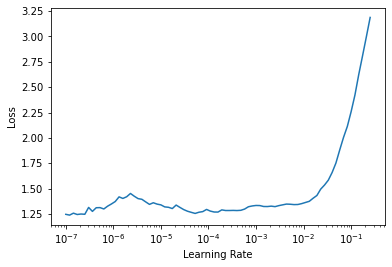

In [ ]:
learn.lr_find()

We are stopping our training on 5 epochs in order to avoid overfitting, on the 6th epoch the validation loss becomes more than during the previous epoch. We are saving the weights to the file **'stage-2'** in order to be able to load our model again at any point if we made some changes we want to revert. 

In [ ]:
learn.fine_tune(5)
learn.save(file = Path('stage-2'), with_opt=True)

epoch,train_loss,valid_loss,accuracy,time
0,1.761737,1.583552,0.580026,07:10


epoch,train_loss,valid_loss,accuracy,time
0,1.766307,1.619809,0.565810,08:20
1,1.696362,1.532166,0.582751,08:21
2,1.328151,1.347823,0.637365,08:21
3,0.816249,1.187785,0.682857,08:19
4,0.538863,1.167693,0.690558,08:20


Path('/kaggle/working/stage-2.pth')

NOTE: As we are limited on resources in Kaggle, we need to reduce parameter *sz* to 64, even though it will affect the common accuracy rate. The memory issue running ClassificationInterpretation in Kaggle is a known issue when using fastai, and can be solved by buying more RAM from Google, which we don't consider doing. Current version is optimez to run the code without hitting the memory error.

In [ ]:
interp = ClassificationInterpretation.from_learner(learn)

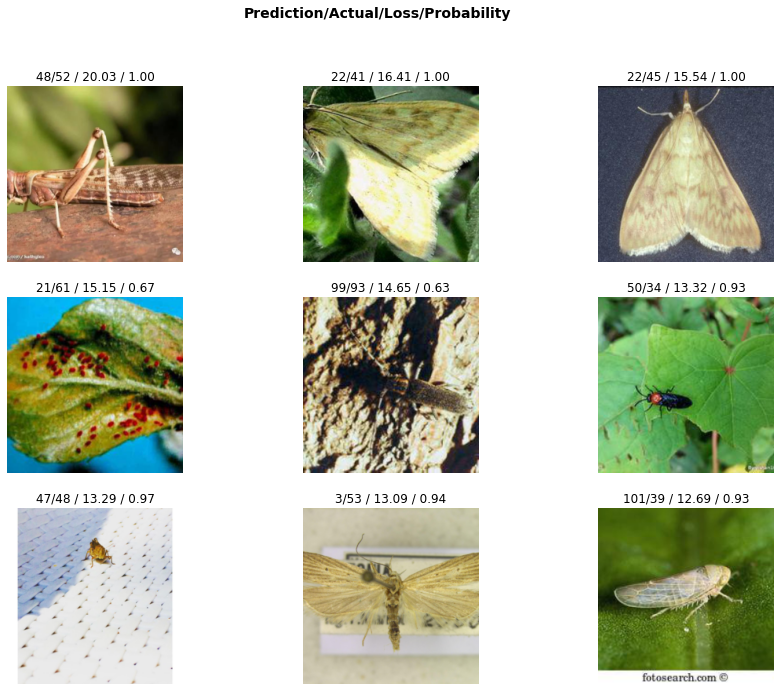

In [ ]:
interp.plot_top_losses(9, figsize=(15,11))

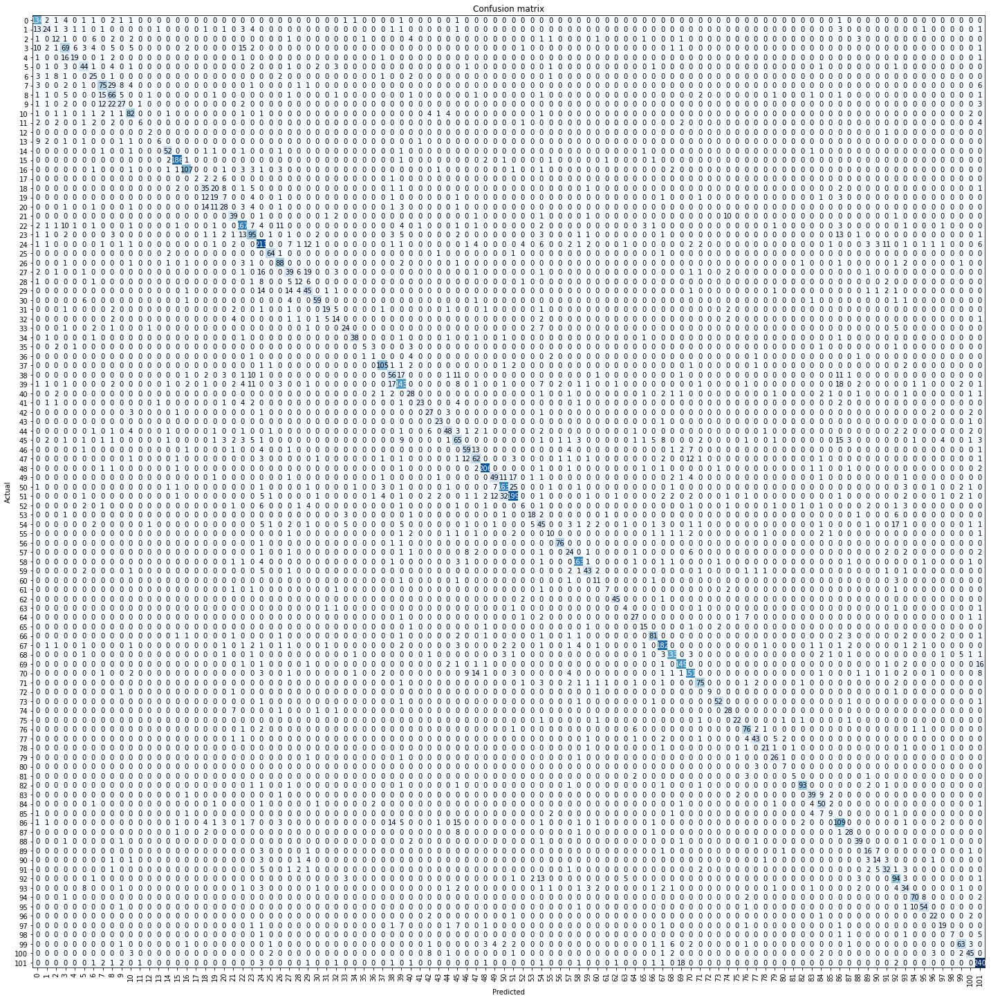

In [ ]:
interp.plot_confusion_matrix(figsize=(20,20))

We can compare this confusion matrix with the matrix we had before we made a class distribution more equal (*check the first part of the notebook*). We can notice that before we cut the biggest classes, our confusion matrix clearly give a high confusion rate on the classes 24, 70 and 101, which had extremely large amount of images comparing to other classes.


![2020-12-21%2012.18.11.jpg](attachment:2020-12-21%2012.18.11.jpg)

# PREDICTION ON TEST AND SUBMISSION

This part is dedicated to building a final *results.csv* with needed columns and classes following the *simple_submission.csv* file presented as an example. 

In [ ]:
testImages = get_image_files(pathToTestImages)
len(testImages)

22619

In [ ]:
results=pd.DataFrame()
for image in testImages:
    results=results.append({"name":image.name,"class":learn.predict(image)[0]},ignore_index=True)

In [ ]:
results.size

TypeError: 'numpy.int64' object is not callable

In [ ]:
results.head()

,class,name
0,48,05938.jpg
1,58,39500.jpg
2,71,58068.jpg
3,86,39101.jpg
4,4,20513.jpg


In [ ]:
results = results[['name', 'class']]

In [ ]:
results.head()

,name,class
0,05938.jpg,48
1,39500.jpg,58
2,58068.jpg,71
3,39101.jpg,86
4,20513.jpg,4


In [ ]:
results = results.sort_values('name')
results.head()

,name,class
21847,00000.jpg,4
10672,00001.jpg,59
2596,00004.jpg,101
6744,00007.jpg,28
14744,00010.jpg,101


In [ ]:
results.to_csv("results.csv",index=False)

# Conclusion

According to the results and work that we have done during this project we can conclude that pretrained huge models works way better with the real datasets than models that we were trying to train from scratch. Taking into the account the sizes of CPU, GPU and RAM we are having in this platform we also got an experience to adjust our work in settings to these limits.
On top of that, we had really interesting time discussing about data augmentation techniques since we noticed immediately how powerful they are and how much they improved our results just by applying some transformations. We then tried to figure out which were the best augmentations to conduct on our dataset but we couldn't apply all of them. But we acknowledge that, for future works with images, this aspect is not to be underestimate since can bring great improvement to the network.

![image.png](attachment:image.png)

To merge three result files together and find the most common among those, the following code was used locally:

In [ ]:
import pandas as pd

result1 = pd.read_csv("results1.csv",header=None,names=['name','class'], sep=",")
result1.head()
result2 = pd.read_csv("results2.csv",header=None,names=['name','class'], sep=",")
result2.head()
result3 = pd.read_csv("results3.csv",header=None,names=['name','class'], sep=",")
if __name__ == '__main__':
    result_merged = result3.copy()
    print(result_merged.head())
    for line in range(len(result1)):
        if result1.iloc[line, :]['class'] == result2.iloc[line, :]['class'] or result1.iloc[line, :]['class'] == \
                result3.iloc[line, :]['class']:
            result_merged.iloc[line, :]['class'] = result1.iloc[line, :]['class']
        else:
            if ((result1.iloc[line, :]['class'] == result2.iloc[line, :]['class']) or (
                    result2.iloc[line, :]['class'] == result3.iloc[line, :]['class'])): result_merged.iloc[line, :][
                'class'] = result2.iloc[line, :]['class']
            else:
                result_merged.iloc[line, :]['class'] = result3.iloc[line, :]['class']
    result_merged = result_merged.iloc[1:]
    print(result_merged.head())
    print(result_merged.size)
    result_merged.to_csv("results_final.csv", index=False)